In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/driving-video-with-object-tracking/mot_labels.csv
/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/02506726-0e9b815e.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/01317a31-6ea7d85d.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0153f03b-3b26c404.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/007c11bf-f6da335c.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/01461010-eeca4bf2.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/00f7eac8-5193d600.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/00ccf2e8-59a6bfc9.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k

In [3]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm.notebook import tqdm
import subprocess
import warnings
warnings.filterwarnings("ignore")

In [4]:
input_file = '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '026c7465-309f6d33.mp4',
                '-loglevel',
                'quiet']
              )

ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)
ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)


CompletedProcess(args=['ffmpeg', '-i', '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov', '-qscale', '0', '026c7465-309f6d33.mp4', '-loglevel', 'quiet'], returncode=0)

In [5]:
!ls -GFlash --color

total 14M
4.0K drwxr-xr-x 3 root 4.0K Jun 24 10:20 ./
4.0K drwxr-xr-x 5 root 4.0K Jun 24 10:18 ../
4.0K drwxr-xr-x 2 root 4.0K Jun 24 10:18 .virtual_documents/
 14M -rw-r--r-- 1 root  14M Jun 24 10:21 026c7465-309f6d33.mp4
4.0K ---------- 1 root  263 Jun 24 10:17 __notebook_source__.ipynb


**Display Video in notebook**

In [6]:
ipd.Video('026c7465-309f6d33.mp4', width=500)

**************Open Video and read Metadata**

In [7]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

In [8]:
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f"Height {height}, Width {width}")

Height 720.0, Width 1280.0


In [9]:
#Get fraeme per second
fps = cap.get(cv2.CAP_PROP_FPS)
print(f"FPS: {fps:0.2f}")

FPS: 59.94


In [10]:
cap.release()

# Pulling in Images from Video

In [11]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
ret, img = cap.read()
print(f"Returned {ret} and img of shape {img.shape}")

Returned True and img of shape (720, 1280, 3)


In [36]:
## Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

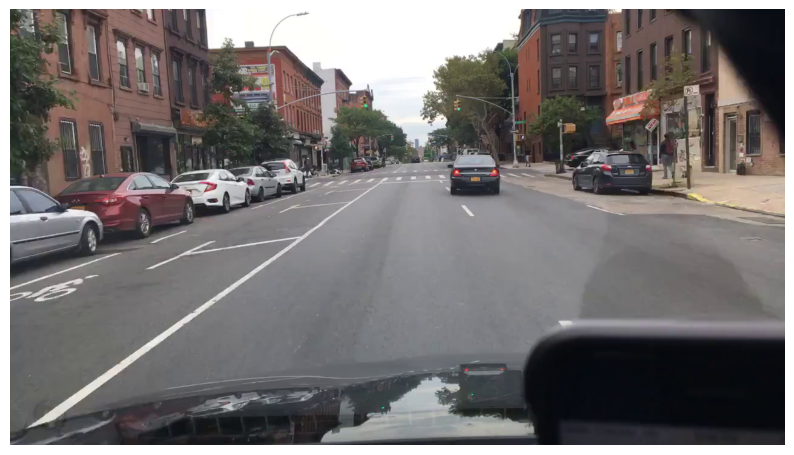

In [37]:
display_cv2_img(img)

In [38]:
cap.release()

# # Display Multiple frames from the video

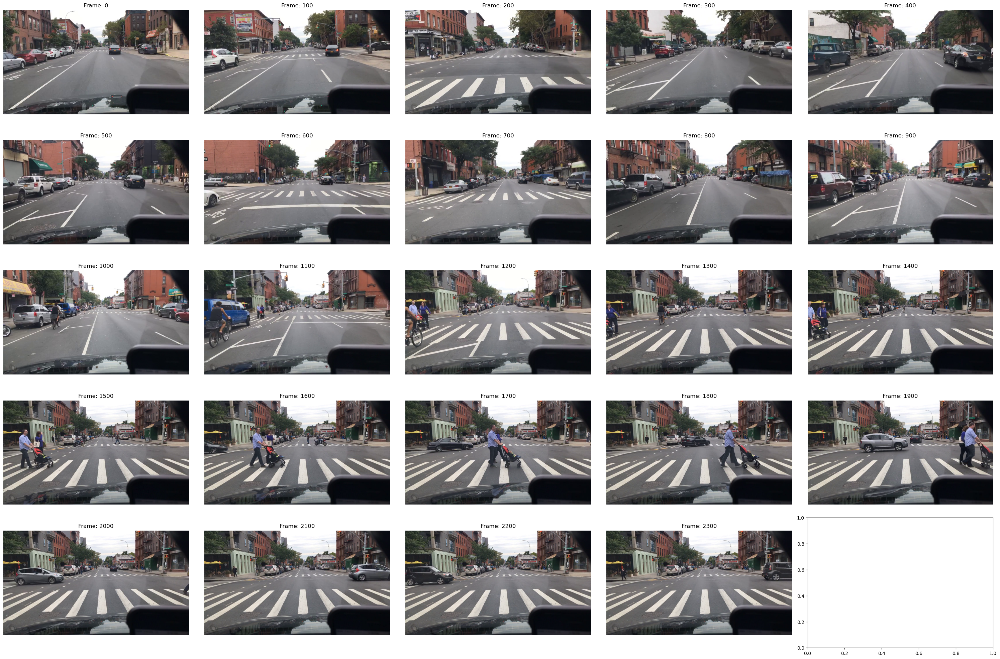

In [45]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

# Add Annotations to Video Images

In [56]:
labels = pd.read_csv('../input/driving-video-with-object-tracking/mot_labels.csv',
                     low_memory=False)
video_labels = (
    labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

In [57]:
video_labels["category"].value_counts()

car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: category, dtype: int64

In [59]:
# Pull frame 1035

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

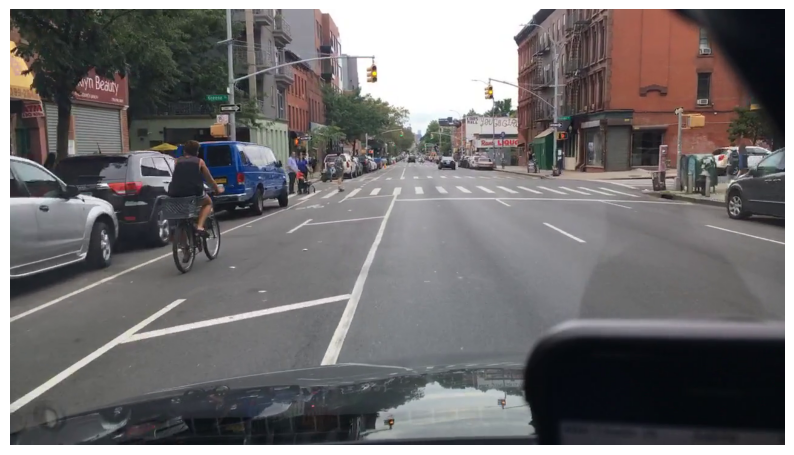

In [60]:
display_cv2_img(img)

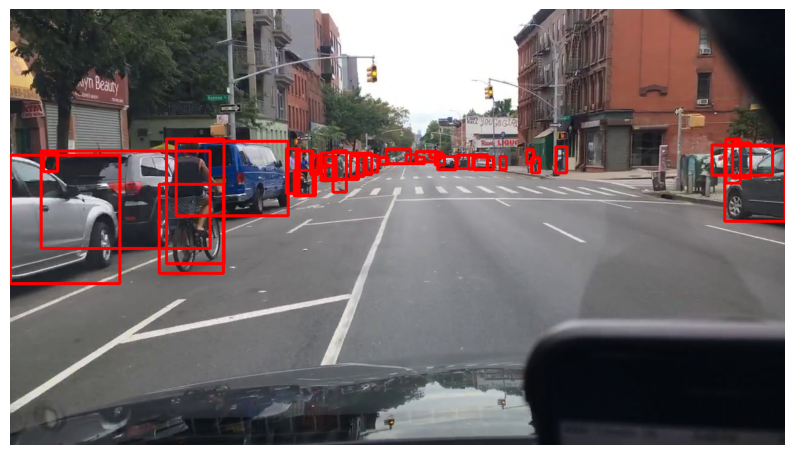

In [61]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)

display_cv2_img(img_example)

# Displaying Colored by Category

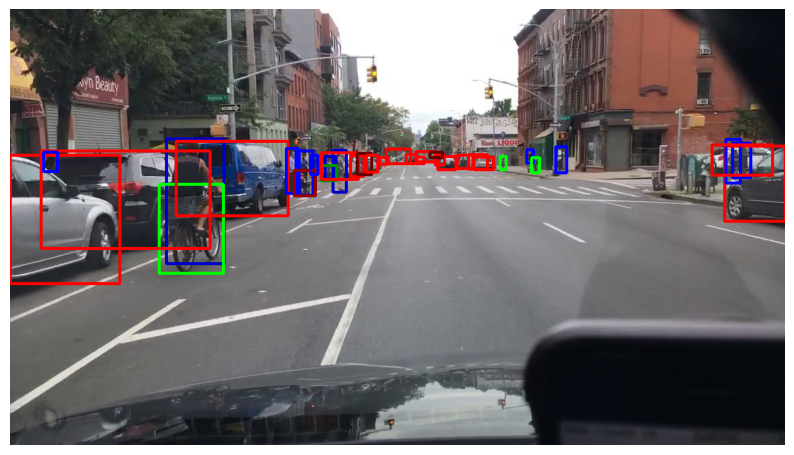

In [63]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)

## Adding text

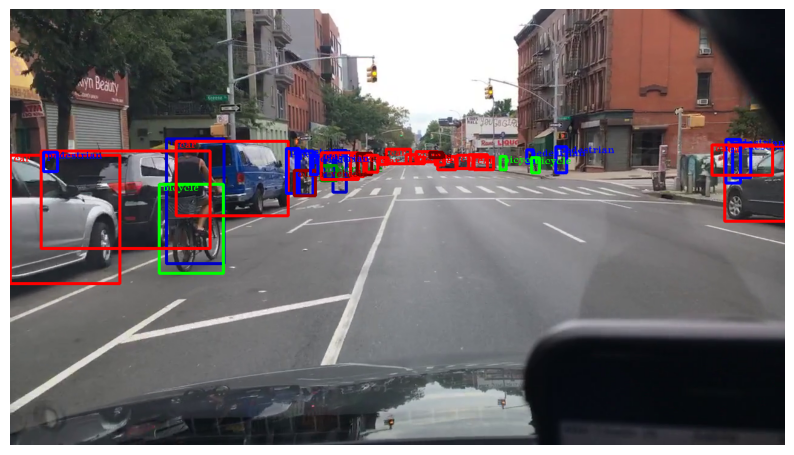

In [65]:
frame_labels = video_labels.query("video_frame == @frame")
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)
display_cv2_img(img_example)
cap.release()

# Lables and Output Annotated Video

In [67]:
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img

In [68]:
!rm -r out_test.mp4


rm: cannot remove 'out_test.mp4': No such file or directory


In [70]:
VIDEO_CODEC = "mp4v"
fps = 59.94
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                fps,
                (width, height))

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    img = add_annotations(img, frame, video_labels)
    out.write(img)
out.release()
cap.release()

  0%|          | 0/2398 [00:00<?, ?it/s]

In [71]:
!ls -GFlash -color


total 85M
 72M -rw-r--r-- 1 root  72M Jun 24 11:10 out_test.mp4
4.0K ---------- 1 root  263 Jun 24 10:17 __notebook_source__.ipynb
 14M -rw-r--r-- 1 root  14M Jun 24 10:21 026c7465-309f6d33.mp4
4.0K drwxr-xr-x 2 root 4.0K Jun 24 10:18 .virtual_documents/
4.0K drwxr-xr-x 5 root 4.0K Jun 24 10:18 ../
4.0K drwxr-xr-x 3 root 4.0K Jun 24 11:09 ./


# Convert our labeled output to mp4 and view

In [72]:
tmp_output_path = "out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        '-loglevel',
        'quiet'
    ]
)

ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)
ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)


CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [73]:
!ls -GFlash --color


total 114M
4.0K drwxr-xr-x 3 root 4.0K Jun 24 11:10 ./
4.0K drwxr-xr-x 5 root 4.0K Jun 24 10:18 ../
4.0K drwxr-xr-x 2 root 4.0K Jun 24 10:18 .virtual_documents/
 14M -rw-r--r-- 1 root  14M Jun 24 10:21 026c7465-309f6d33.mp4
4.0K ---------- 1 root  263 Jun 24 10:17 __notebook_source__.ipynb
 72M -rw-r--r-- 1 root  72M Jun 24 11:10 out_test.mp4
 29M -rw-r--r-- 1 root  29M Jun 24 11:11 out_test_compressed.mp4


In [74]:
ipd.Video('out_test_compressed.mp4', width=600)
